# Coursework 1: Convolutional Neural Networks
### Autograding
Part 1 of this coursework is autograded. This notebook comes with embedded tests which will verify that your implementations provide outputs with the appropriate types and shapes required for our hidden tests. You can run these same public tests through [LabTS](https://teaching.doc.ic.ac.uk/labts) when you have finished your work, to check that we get the same results when running these public tests.

Hidden tests will be ran after the submission deadline, and cannot be accessed :)

### Setting up working environment

For this coursework you will need to train a large network, therefore we recommend you work with Google Colaboratory or Lab cluster, where you can access GPUs.

Please refer to the Intro lecture for getting set up on the various GPU options.

**To run the public tests within colab** you will need to copy the "tests" folder to the /content/ directory (this is the default working directory - you can also change directories with %cd). You may also need to place a copy of the CW ipynb in the /content/ directory. A better option is to mount colab on gdrive and keep the files there (so you only need to do the set up once).

#### Setup
You will need to install pytorch and other libraries by running the following cell:

<font color="orange">**The deadline for submission is Tuesday, 6 Feb by 6 pm** </font>

In [ ]:
!pip install -q otter-grader pandoc torch torchvision scikit-learn seaborn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.8/158.8 kB 2.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.1/160.1 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 152.7/152.7 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.2/100.2 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.0/127.0 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 11.3 MB/s eta 0:00:00


In [ ]:
# Initialization Cell
try:
    WORKING_ENV = 'COLAB' # Can be LABS, COLAB, PAPERSPACE, SAGEMAKER
    USERNAME = 'your_username' # If working on Lab Machines - Your college username
    assert WORKING_ENV in ['LABS', 'COLAB', 'PAPERSPACE', 'SAGEMAKER']

    if WORKING_ENV == 'COLAB':
        from google.colab import drive
        %load_ext google.colab.data_table
        d1_cw1_repo_path = 'Lectureship/CW/dl_cw1/' # path in your gdrive to the repo
        content_path = f'/content/drive/MyDrive/{d1_cw1_repo_path}' # path to gitrepo in gdrive after mounting
        drive.mount('/content/drive/') # Outputs will be saved in your google drive

    elif WORKING_ENV == 'LABS':
        content_path = f'/vol/bitbucket/{USERNAME}/dl/dl_cw1/' # You may want to change this
        # Your python env and training data should be on bitbucket
        if 'vol' not in content_path:
            import warnings
            warnings.warn(
                'It is best to create a dir in /vol/bitbucket/ otherwise you will quickly run into memory issues'
            )

    elif WORKING_ENV == 'PAPERSPACE': # Using Paperspace
        # Paperspace does not properly render animated progress bars
        # Strongly recommend using the JupyterLab UI instead of theirs
        !pip install ipywidgets
        content_path = '/notebooks'

    elif WORKING_ENV == 'SAGEMAKER':
        content_path = '/home/studio-lab-user/sagemaker-studiolab-notebooks/'
    else:
        raise NotImplementedError()

    import otter
    import os
    if not os.path.exists(f'{content_path}tests'):
        raise ValueError('Cannot find the public tests folder')
    grader = otter.Notebook(
        f'{content_path}dl_cw_1.ipynb',
        tests_dir=f'{content_path}tests')
    import matplotlib.pyplot as plt # DO NOT use %matplotlib inline in the notebook
    import numpy as np
    rng_seed = 90
except:
    # This is a fallback initialization for running on LabTS. Please leave this in place before submission.
    import otter
    grader = otter.Notebook("dl_cw_1.ipynb")
    import matplotlib.pyplot as plt
    import numpy as np
    rng_seed = 90


Mounted at /content/drive/


## Introduction
In this courswork you will explore various deep learning functionalities through implementing a number of pytorch neural network operations/layers and creating your own deep learning model and methodology for a high dimensional classification problem.

#### Intended learning outcomes
- An understanding of the mechanics behind convolutional, pooling, linear and batch norm operations.
- Be able to implement convolution, pooling, linear and batch norm layers from basic building blocks.
- Experience designing, implementing and optimising a classifier for a high dimensional dataset.

## Part 1 (50 points)

In this part, you will use basic Pytorch operations to define the 2D convolution, 2D max pooling, linear layer, as well as 2D batch normalization operations. Being computer scientists we care about efficiency, we therefore do not want to see any _for loops_!

**Your Task**
- Implement the forward pass for Conv2D (15 points), MaxPool2D (15 points), Linear (5 points) and BatchNorm2d (15 points)
- You are **NOT** allowed to use the torch.nn modules (The one exception is that the class inherits from nn.Module)

_hint: check out F.unfold and F.fold, they may be helpful_

In [40]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import math

class Conv2d(nn.Module):
    def __init__(self,
                 in_channels,
                 out_channels,
                 kernel_size,
                 stride=1,
                 padding=0,
                 bias=True):

        super(Conv2d, self).__init__()
        """
        An implementation of a convolutional layer.

        The input consists of N data points, each with C channels, height H and
        width W. We convolve each input with F different filters, where each filter
        spans all C channels and has height H' and width W'.

        Parameters:
        - w: Filter weights of shape (F, C, H', W',)
        - b: Biases of shape (F,)
        - kernel_size: Union[int, (int, int)], Size of the convolving kernel
        - stride: Union[int, (int, int)], Number of pixels between adjacent receptive fields in the
            horizontal and vertical directions.
        - padding: Union[int, (int, int)], Number of pixels that will be used to zero-pad the input.
        """
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        # TODO: Define the parameters used in the forward pass

        # Verify for each parameter their shape and convert it into a tuple
        if isinstance(kernel_size, int):
            kernel_size = (kernel_size, kernel_size)
        if isinstance(stride, int):
            stride = (stride, stride)
        if isinstance(padding, int):
            padding = (padding, padding)

        self.bias = bias #Bool variable

        # Do not initialize weights or biases with torch.empty() but rather use torch.zeros()
        # Weights should have shape [out_channels, in_channels, kernel_x, kernel_y]
        self.w = torch.zeros((out_channels, in_channels, kernel_size[0], kernel_size[1]))
        # Bias should have shape [out_channels]
        self.b = torch.zeros((out_channels))
        self.F = out_channels
        self.C = in_channels
        self.kernel_size = kernel_size
        self.stride = stride
        self.padding = padding

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    def forward(self, x):
        """
        Input:
        - x: Input data of shape (N, C, H, W)
        Output:
        - out: Output data, of shape (N, F, H', W').
        """
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        # TODO: Implement the forward pass                                     #
        N, C, H, W = x.shape

        # Unfold the input with F.unfold to obtain a 3D tensor
        input_unfold = F.unfold(x, kernel_size=self.kernel_size, padding=self.padding, stride=self.stride)

        #print("x input:", x.shape)
        #print("x input unfold:",input_unfold.shape)

        #Reshaping weight value:
        w_res = self.w.view(self.w.size(0), -1).t()

        #print("w:",self.w.shape)
        #print("w res:",w_res.shape)

        # Matrix multiplication to realize the convolution between unfolded input and reshaped weights
        out_conv_unfold = input_unfold.transpose(1, 2).matmul(w_res).transpose(1, 2) #matmul allows to multiply each patch with each filter

        if self.bias:  #add the bias parameter if needed
          out_conv_unfold = out_conv_unfold + self.b.view(-1, 1)  #reshape bias value to stick with the convolution form

        # Compute dimension for the output in order to get the fold output (below)
        output_size_H = (H - self.kernel_size[0] + 2 * self.padding[0]) // self.stride[0] + 1
        output_size_W = (W - self.kernel_size[1] + 2 * self.padding[1]) // self.stride[1] + 1

        # Fold the output with F.fold to retrieve 4D tensor
        out = F.fold(out_conv_unfold, (output_size_H, output_size_W), (1, 1))

        #print("out:",out.shape)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        return out

In [ ]:
grader.check("Convolution Layer")

Convolution Layer results: All test cases passed!
Convolution Layer - 1 message: Shape Test Passed
Convolution Layer - 2 message: Type Test Passed
Convolution Layer - 3 message: Param Name Test Passed
Convolution Layer - 4 message: Param Shape Test Passed

In [ ]:
"""
#Test for Conv2D:
x = torch.rand((4, 3, 32, 32))
W = torch.rand((4, 3, 4, 4))
b = torch.rand(4)

Conv2d_Py = nn.Conv2d(3, 4, 4, (2,3), (1,2))
Conv2d_Py.weight = nn.Parameter(W)
Conv2d_Py.bias = nn.Parameter(b)

Conv2d_ps = Conv2d(3, 4, 4, (2,3), (1,2))
Conv2d_ps.w = W
Conv2d_ps.b = b

pytorch_res = Conv2d_Py.forward(x)
ps_res = Conv2d_ps.forward(x)

torch.allclose(pytorch_res, ps_res)
"""

True

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class MaxPool2d(nn.Module):
    def __init__(self, kernel_size):
        super(MaxPool2d, self).__init__()
        """
        An implementation of a max-pooling layer.

        Parameters:
        - kernel_size: Union[int, (int, int)], the size of the window to take a max over
        """
        # TODO: Define the parameters used in the forward pass                 #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        # Handle the case where kernel_size is a single integer to make it tuple
        if isinstance(kernel_size, int):
            kernel_size = (kernel_size, kernel_size)

        self.kernel_size = kernel_size
        self.stride = self.kernel_size   #assuming no overlapping

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


    def forward(self, x):
        """
        Input:
        - x: Input data of shape (N, C, H, W)
        Output:
        - out: Output data, of shape (N, C, H', W').
        """
        # TODO: Implement the forward pass                                     #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        N, C, H, W = x.shape

        # Extracting the patches using unfold
        # Unfold shape: (N, number of values within a block, total number of block)
        input_unfold = F.unfold(x, kernel_size=self.kernel_size, stride=self.stride)

        # Reshape input_unfolded to divide a block regarding the channel (in order to find the max for each channel for each block)
        input_unfold_res = input_unfold.view(N, C, self.kernel_size[0] * self.kernel_size[1], -1).max(dim=2)[0]

        # Compute dimension for the output in order to get the fold output (below)
        output_size_H = (H - self.kernel_size[0]) // self.stride[0] + 1
        output_size_W = (W - self.kernel_size[1]) // self.stride[1] + 1

        # Reshape to the output shape (N, C, output_size_H, output_size_W)
        out = input_unfold_res.view(N, C, output_size_H, output_size_W)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        return out


In [ ]:
grader.check("MaxPool Layer")

MaxPool Layer results: All test cases passed!
MaxPool Layer - 1 message: Shape Test Passed
MaxPool Layer - 2 message: Type Test Passed

In [ ]:
"""
#Test for MaxPooling:
x = torch.rand((8, 6, 6, 12))

MaxPool2d_Py = nn.MaxPool2d(4)

MaxPool2d_ps = MaxPool2d(4)

pytorch_res = MaxPool2d_Py.forward(x)
ps_res = MaxPool2d_ps.forward(x)

torch.allclose(pytorch_res, ps_res)
"""

True

In [ ]:
class Linear(nn.Module):
    def __init__(self, in_channels, out_channels, bias=True):
        super(Linear, self).__init__()
        """
        An implementation of a Linear layer.

        Parameters:
        - weight: the learnable weights of the module of shape (in_channels, out_channels).
        - bias: the learnable bias of the module of shape (out_channels).
        """
        # TODO: Define the parameters used in the forward pass                 #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        # self.register_parameter is not used as it was mentioned on piazza
        # that this will be overridden
        # Also no initialisation methods for this reason
        #self.w = torch.zeros((out_channels, in_channels))
        self.w = torch.zeros((in_channels, out_channels))
        self.b = torch.zeros((out_channels))

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    def forward(self, x):
        """
        Input:
        - x: Input data of shape (N, *, H) where * means any number of additional
        dimensions and H = in_channels
        Output:
        - out: Output data of shape (N, *, H') where * means any number of additional
        dimensions and H' = out_channels
        """
        # TODO: Implement the forward pass                                     #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        #out = x.matmul(self.w.t()) + self.b
        out = x.matmul(self.w) + self.b

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        return out

In [ ]:
grader.check("Linear Layer")

Linear Layer results: All test cases passed!
Linear Layer - 1 message: Shape Test Passed
Linear Layer - 2 message: Type Test Passed
Linear Layer - 3 message: Param Name Test Passed
Linear Layer - 4 message: Param Shape Test Passed

In [ ]:
"""
#Test for Linear:
x = torch.rand((8, 6, 6, 6))
W = torch.rand((6, 6))
b = torch.rand(6)

Linear_Py = nn.Linear(6,6)
Linear_Py.weight = nn.Parameter(W)
Linear_Py.bias = nn.Parameter(b)

Linear_ps = Linear(6,6)
Linear_ps.w = W.t() #here we take tranpose of W as we consider weight of shape (in_channels, out_channels)
Linear_ps.b = b

pytorch_res = Linear_Py.forward(x)
ps_res = Linear_ps.forward(x)

torch.allclose(pytorch_res, ps_res)
"""

True

In [ ]:
class BatchNorm2d(nn.Module):
		def __init__(self, num_features, eps=1e-05, momentum=0.1):
				super(BatchNorm2d, self).__init__()
				"""
				An implementation of a Batch Normalization over a mini-batch of 2D inputs.

				The mean and standard-deviation are calculated per-dimension over the
				mini-batches and gamma and beta are learnable parameter vectors of
				size num_features.

				Parameters:
				- num_features: C from an expected input of size (N, C, H, W).
				- eps: a value added to the denominator for numerical stability. Default: 1e-5
				- momentum: the value used for the running_mean and running_var
				computation. Default: 0.1 . (i.e. 1-momentum for running mean)
				- gamma: the learnable weights of shape (num_features).
				- beta: the learnable bias of the module of shape (num_features).
				"""
				# TODO: Define the parameters used in the forward pass                 #
				# *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
				self.num_features = num_features
				self.eps = eps
				self.momentum = momentum

				# self.register_parameter is not used as it was mentioned on piazza
				# that this will be overridden
				self.gamma = torch.ones(num_features)	#scale initialized at 1 because it is the neutral value for multiplication
				self.beta = torch.zeros(num_features)	#shift initialized at 0 because it is the neutral value for addition

				# Running mean and variance for the prediction part
				self.running_mean = torch.zeros(num_features)	#same shape gamma and beta
				self.running_var = torch.ones(num_features)

				# *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


		def forward(self, x):
				"""
				During training this layer keeps running estimates of its computed mean and
				variance, which are then used for normalization during evaluation.
				Input:
				- x: Input data of shape (N, C, H, W)
				Output:
				- out: Output data of shape (N, C, H, W) (same shape as input)
				"""
				# TODO: Implement the forward pass                                     #
				#       (be aware of the difference for training and testing)          #
				# *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

				if self.training:	#training is integrated in the nn.module
						# Calculate batch mean and var (both 1D tensor containing respectively mean and variance for each channel)
						batch_mean = torch.mean(x, dim=(0, 2, 3))	#averaging across all the batch size (N) and taking into account all pixel
						batch_var = torch.var(x, dim=(0, 2, 3))

						#print(batch_mean.shape)

						# Update the running mean and variance
						self.running_mean = (1 - self.momentum) * batch_mean + self.momentum * self.running_mean
						self.running_var = (1 - self.momentum) * batch_var + self.momentum * self.running_var

						# Normalize (with reshaping batch_mean and batch_var to get 4D tensor and vectorize operation with x)
						x_BatchNorm = (x - batch_mean[None, :, None, None]) / torch.sqrt(batch_var[None, :, None, None] + self.eps)

				else:
						# Normalize during testing (with reshaping batch_mean and batch_var to get 4D tensor and vectorize operation with x)
						x_BatchNorm = (x - self.running_mean[None, :, None, None]) / torch.sqrt(self.running_var[None, :, None, None] + self.eps)

				# Noramlized adjusted version with learnable parameters (gamma and beta)
				out = self.gamma[None, :, None, None] * x_BatchNorm + self.beta[None, :, None, None]

				# *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
				return out

In [ ]:
grader.check("BatchNorm Layer")

BatchNorm Layer results: All test cases passed!
BatchNorm Layer - 1 message: Shape Test Passed
BatchNorm Layer - 2 message: Type Test Passed
BatchNorm Layer - 3 message: Param Name Test Passed
BatchNorm Layer - 4 message: Param Shape Test Passed

In [ ]:
"""
#Test for BatchNorm2d:
x = torch.randn(4, 10, 32, 32)
n_features = x.shape[1]


BatchNorm2d_Py = nn.BatchNorm2d(n_features)


BatchNorm2d_ps = BatchNorm2d(n_features)
#Copy every parameter of the pytorch version
BatchNorm2d_ps.gamma = BatchNorm2d_Py.weight.data.clone()
BatchNorm2d_ps.beta = BatchNorm2d_Py.bias.data.clone()
BatchNorm2d_ps.running_mean = BatchNorm2d_Py.running_mean.clone()
BatchNorm2d_ps.running_var = BatchNorm2d_Py.running_var.clone()


BatchNorm2d_ps.train()  #activate mode train for personal version
BatchNorm2d_Py.train()  #activate mode train for pytorch version

ps_res = BatchNorm2d_ps.forward(x)
pytorch_res = BatchNorm2d_Py.forward(x)
torch.allclose(pytorch_res, ps_res, atol=1e-3)
"""

True

## Part 2 (40 points)

In this part, you will design, train and optimise a custom deep learning model for classifying a specially selected subset of Imagenet. Termed NaturalImageNet, it is made up of a hand selected subset of the famous ImageNet dataset. The dataset contains 20 classes, all animals from the natural world. We hope that this dataset will be fun to work with but also a challenge.

You will be marked on your experimental process, methods implemented and your reasoning behind your decisions. While there will be marks for exceeding a baseline performance score we stress that students should **NOT** spend excessive amounts of time optimising performance to silly levels.

We have given you some starter code, please feel free to use and adapt it.

**Your Task**
1. Develop/adapt a deep learning pipeline to maximise performance on the test set. (28 points)
    * 8 points will be awarded for improving on the baseline score on the test set. Don't worry you can get full marks here by improving by a minor amount.
    * 20 points will be awarded for the adaptations made to the baseline model and pipeline.

2. Answer the qualititative questions (12 points)

**Downloading NaturalImageNet**

In [ ]:
ON_COLAB = False

!wget https://zenodo.org/record/5846979/files/NaturalImageNetTest.zip?download=1
!wget https://zenodo.org/record/5846979/files/NaturalImageNetTrain.zip?download=1
if ON_COLAB:
    !unzip /content/NaturalImageNetTest.zip?download=1 > /dev/null
    !unzip /content/NaturalImageNetTrain.zip?download=1 > /dev/null
else:
    !unzip NaturalImageNetTest.zip?download=1 > /dev/null
    !unzip NaturalImageNetTrain.zip?download=1 > /dev/null

--2024-02-01 14:02:07--  https://zenodo.org/record/5846979/files/NaturalImageNetTest.zip?download=1
Resolving zenodo.org (zenodo.org)... 188.185.79.172, 188.184.103.159, 188.184.98.238, ...
Connecting to zenodo.org (zenodo.org)|188.185.79.172|:443... connected.
HTTP request sent, awaiting response... 301 MOVED PERMANENTLY
Location: /records/5846979/files/NaturalImageNetTest.zip [following]
--2024-02-01 14:02:08--  https://zenodo.org/records/5846979/files/NaturalImageNetTest.zip
Reusing existing connection to zenodo.org:443.
HTTP request sent, awaiting response... 200 OK
Length: 138507970 (132M) [application/octet-stream]
Saving to: ‘NaturalImageNetTest.zip?download=1’

NaturalImageNetTest 100%[===================>] 132.09M  18.3MB/s    in 8.7s    

2024-02-01 14:02:17 (15.3 MB/s) - ‘NaturalImageNetTest.zip?download=1’ saved [138507970/138507970]

--2024-02-01 14:02:17--  https://zenodo.org/record/5846979/files/NaturalImageNetTrain.zip?download=1
Resolving zenodo.org (zenodo.org)... 188

In [ ]:
#torch
import torch
from torch.nn import Conv2d, MaxPool2d
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
#other
import matplotlib.pyplot as plt
import numpy as np
# set the seed for reproducibility
rng_seed = 90
torch.manual_seed(rng_seed)

In [ ]:
# When we import the images we want to first convert them to a tensor.
# It is also common in deep learning to normalise the the inputs. This
# helps with stability.
# To read more about this subject this article is a great one:
# https://towardsdatascience.com/understand-data-normalization-in-machine-learning-8ff3062101f0

# transforms is a useful pytorch package which contains a range of functions
# for preprocessing data, for example applying data augmentation to images
# (random rotations, blurring the image, randomly cropping the image). To find out
# more please refer to the pytorch documentation:
# https://pytorch.org/docs/stable/torchvision/transforms.html

mean = torch.Tensor([0.485, 0.456, 0.406])
std = torch.Tensor([0.229, 0.224, 0.225])
transform = transforms.Compose(
        [
            transforms.Resize(256),
            transforms.CenterCrop(256),
            transforms.ToTensor(),
            transforms.Normalize(mean.tolist(), std.tolist()),
        ]
    )

transform_train = transforms.Compose(
        [
            transforms.RandomRotation(degrees=20),
            transforms.RandomAffine(degrees=0, translate=(0, 0.08), scale=(0.8, 1.2)),
            transforms.RandomHorizontalFlip(p=0.3),

            transforms.Resize(256),
            transforms.CenterCrop(256),
            transforms.ToTensor(),
            transforms.Normalize(mean.tolist(), std.tolist()),
        ]
    )


train_path = ('/content/' if ON_COLAB else '') + 'NaturalImageNetTrain'
test_path = ('/content/' if ON_COLAB else '') +'NaturalImageNetTest'

#train_dataset = datasets.ImageFolder(train_path, transform=transform)
train_dataset = datasets.ImageFolder(train_path, transform=transform_train)
test_dataset = datasets.ImageFolder(test_path, transform=transform)

# Create train val split
n = len(train_dataset)
n_val = int(n/10)

train_set, val_set = torch.utils.data.random_split(train_dataset, [n-n_val, n_val])


print(len(train_set), len(val_set), len(test_dataset))


# The number of images to process in one go. If you run out of GPU
# memory reduce this number!
batch_size = 64

# Dataloaders are a great pytorch functionality for feeding data into our AI models.
# see https://pytorch.org/docs/stable/data.html?highlight=dataloader#torch.utils.data.DataLoader
# for more info.

loader_train = DataLoader(train_set, batch_size=batch_size, shuffle=True, num_workers=2)
loader_val = DataLoader(val_set, batch_size=batch_size, shuffle=True, num_workers=2)
loader_test = DataLoader(test_dataset, batch_size=batch_size, shuffle=True, num_workers=2)

17986 1998 2000


In [ ]:
unnormalize = transforms.Normalize((-mean / std).tolist(), (1.0 / std).tolist())

def denorm(x):
    '''
    Function to reverse the normalization so that we can visualise the outputs
    '''
    x = unnormalize(x)
    x = x.view(x.size(0), 3, 256, 256)
    return x

def show(img):
    '''
    function to visualise tensors
    '''
    if torch.cuda.is_available():
        img = img.cpu()
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)).clip(0, 1))

**Visualising some example images**

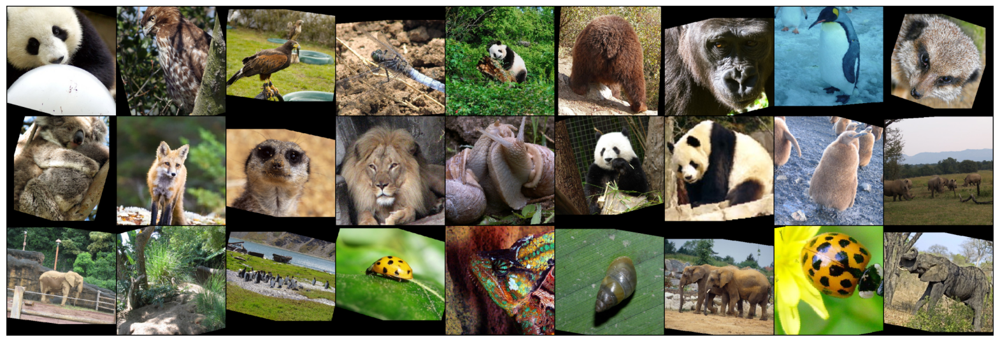

In [ ]:
sample_inputs, _ = next(iter(loader_val))
fixed_input = sample_inputs[:27, :, :, :]

img = make_grid(denorm(fixed_input), nrow=9, padding=2, normalize=False,
                value_range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(20,10))
plt.axis('off')
show(img)

Next, we define ResNet:

In [ ]:
# define resnet building blocks

class ResidualBlock(nn.Module):
    def __init__(self, inchannel, outchannel, stride=1):

        super(ResidualBlock, self).__init__()

        self.left = nn.Sequential(Conv2d(inchannel, outchannel, kernel_size=3,
                                         stride=stride, padding=1, bias=False),
                                  nn.BatchNorm2d(outchannel),
                                  nn.ReLU(inplace=True),
                                  Conv2d(outchannel, outchannel, kernel_size=3,
                                         stride=1, padding=1, bias=False),
                                  nn.BatchNorm2d(outchannel))

        self.shortcut = nn.Sequential()

        if stride != 1 or inchannel != outchannel:

            self.shortcut = nn.Sequential(Conv2d(inchannel, outchannel,
                                                 kernel_size=1, stride=stride,
                                                 padding = 0, bias=False),
                                          nn.BatchNorm2d(outchannel) )

    def forward(self, x):

        out = self.left(x)

        out += self.shortcut(x)

        out = F.relu(out)

        return out



# define resnet

class ResNet(nn.Module):

    def __init__(self, ResidualBlock, num_classes = 20):

        super(ResNet, self).__init__()

        self.inchannel = 64
        self.conv1 = nn.Sequential(nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1, bias=False),
                                   nn.BatchNorm2d(64),
                                   nn.ReLU())

        self.maxpool1 = nn.MaxPool2d(kernel_size=3, stride=2, padding=1) #to divide by 2
        self.layer1 = self.make_layer(ResidualBlock, 64, 3, stride=1)
        self.layer2 = self.make_layer(ResidualBlock, 128, 4, stride=2)
        self.maxpool2 = nn.MaxPool2d(kernel_size=3, stride=2, padding=1) #to divide by 2
        self.layer3 = self.make_layer(ResidualBlock, 256, 6, stride=2)
        self.layer4 = self.make_layer(ResidualBlock, 512, 3, stride=2)
        #self.maxpool = nn.AdaptiveAvgPool2d((1, 1))
        self.maxpool = nn.AdaptiveMaxPool2d((1, 1))
        self.fc = nn.Linear(512, num_classes)


    def make_layer(self, block, channels, num_blocks, stride):

        strides = [stride] + [1] * (num_blocks - 1)

        layers = []

        for stride in strides:

            layers.append(block(self.inchannel, channels, stride))

            self.inchannel = channels

        return nn.Sequential(*layers)


    def forward(self, x):

        x = self.conv1(x)
        x = self.maxpool1(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.maxpool2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.maxpool(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        return x

# please do not change the name of this class
def MyResNet():
    return ResNet(ResidualBlock)

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns


def confusion(preds, y):
  labels = ['African Elephant', 'Kingfisher', 'Deer','Brown Bear', 'Chameleon', 'Dragonfly',
    'Giant Panda', 'Gorilla', 'Hawk', 'King Penguin', 'Koala', 'Ladybug', 'Lion',
    'Meerkat', 'Orangutan', 'Peacock', 'Red Fox', 'Snail', 'Tiger', 'White Rhino']
  # Plotting the confusion matrix
  cm = confusion_matrix(y.cpu().numpy(), preds.cpu().numpy(), normalize='true')
  fig, ax= plt.subplots(1, 1, figsize=(15,10))
  sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

  # labels, title and ticks
  ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels');
  ax.set_title('Confusion Matrix');
  ax.xaxis.set_ticklabels(labels, rotation = 70); ax.yaxis.set_ticklabels(labels, rotation=0);
  plt.show()

def incorrect_preds(preds, y, test_img):
  labels = ['African Elephant', 'Kingfisher', 'Deer','Brown Bear', 'Chameleon', 'Dragonfly',
    'Giant Panda', 'Gorilla', 'Hawk', 'King Penguin', 'Koala', 'Ladybug', 'Lion',
    'Meerkat', 'Orangutan', 'Peacock', 'Red Fox', 'Snail', 'Tiger', 'White Rhino']
  # lets see a sample of the images which were classified incorrectly!
  correct = (preds == y).float()
  test_labels_check = correct.cpu().numpy()
  incorrect_indexes = np.where(test_labels_check == 0)

  test_img = test_img.cpu()
  samples = make_grid(denorm(test_img[incorrect_indexes][:9]), nrow=3,
                      padding=2, normalize=False, value_range=None,
                      scale_each=False, pad_value=0)
  plt.figure(figsize = (20,10))
  plt.title('Incorrectly Classified Instances')
  show(samples)
  labels = np.asarray(labels)
  print('Predicted label',labels[preds[incorrect_indexes].cpu().numpy()[:9]])
  print('True label', labels[y[incorrect_indexes].cpu().numpy()[:9]])
  print('Corresponding images are shown below')

In [ ]:
USE_GPU = True
dtype = torch.float32


if USE_GPU and torch.cuda.is_available():
    device = torch.device('cuda:0')
else:
    device = torch.device('cpu')

print(device)


print_every = 10
def check_accuracy(loader, model, analysis=False):
    loss_val = [] #declare loader loss list to update it in the training part

    # function for test accuracy on validation and test set

    num_correct = 0
    num_samples = 0
    model.eval()  # set model to evaluation mode


    with torch.no_grad():
        for t, (x, y) in enumerate(loader):
            x = x.to(device=device, dtype=dtype)  # move to device
            y = y.to(device=device, dtype=torch.long)
            scores = model(x)
            _, preds = scores.max(1)

            # Validation loss
            loss = F.cross_entropy(scores,y) #use the same loss (cross entropy) as for the training loss
            loss_val.append(loss.item()) #update the loss

            num_correct += (preds == y).sum()
            num_samples += preds.size(0)
            if t == 0 and analysis:
              stack_labels = y
              stack_predicts = preds
            elif analysis:
              stack_labels = torch.cat([stack_labels, y], 0)
              stack_predicts = torch.cat([stack_predicts, preds], 0)
        acc = float(num_correct) / num_samples
        print('Got %d / %d correct of val set (%.2f)' % (num_correct, num_samples, 100 * acc))
        if analysis:
          print('check acc', type(stack_predicts), type(stack_labels))
          confusion(stack_predicts, stack_labels)
          incorrect_preds(preds, y, x)

        loss_loader = np.average(loss_val) #average across the dataloader

        return float(acc), loss_loader #return accuracy and the loss associated to the loader



def train_part(model, optimizer, epochs=1):
    """
    Train a model on NaturalImageNet using the PyTorch Module API.

    Inputs:
    - model: A PyTorch Module giving the model to train.
    - optimizer: An Optimizer object we will use to train the model
    - epochs: (Optional) A Python integer giving the number of epochs to train for

    Returns: Nothing, but prints model accuracies during training.
    """
    model = model.to(device=device)  # move the model parameters to CPU/GPU

    train_loss_list = [] #list of train loss during training part
    valid_loss_list = [] #list of validation loss during training part

    acc_list = []

    for e in range(epochs):

        train_loss_epoch = [] #list of train loss over a single epoch

        for t, (x, y) in enumerate(loader_train):
            model.train()  # put model to training mode
            x = x.to(device=device, dtype=dtype)  # move to device, e.g. GPU
            y = y.to(device=device, dtype=torch.long)

            scores = model(x)
            loss = F.cross_entropy(scores, y)

            # Zero out all of the gradients for the variables which the optimizer
            # will update.
            optimizer.zero_grad()

            loss.backward()

            train_loss_epoch.append(loss.item()) #

            # Update the parameters of the model using the gradients
            optimizer.step()

            if t % print_every == 0:
                print('Epoch: %d, Iteration %d, loss = %.4f' % (e, t, loss.item()))
        acc_val_epoch , valid_losses = check_accuracy(loader_val, model) #get the average validation loss over the validation loader

        acc_list.append(acc_val_epoch)

        train_loss = np.average(train_loss_epoch) #average train loss over an epoch

        train_loss_list.append(train_loss) #final train loss list
        valid_loss_list.append(valid_losses) #final valid loss list

    return model, train_loss_list, valid_loss_list, acc_list #


cuda:0


Total number of parameters is: 21287252
Epoch: 0, Iteration 0, loss = 6.8613
Epoch: 0, Iteration 10, loss = 2.9774
Epoch: 0, Iteration 20, loss = 2.5920
Epoch: 0, Iteration 30, loss = 2.6088
Epoch: 0, Iteration 40, loss = 2.5008
Epoch: 0, Iteration 50, loss = 2.3346
Epoch: 0, Iteration 60, loss = 2.1237
Epoch: 0, Iteration 70, loss = 2.3042
Epoch: 0, Iteration 80, loss = 2.2319
Epoch: 0, Iteration 90, loss = 2.0851
Epoch: 0, Iteration 100, loss = 2.0080
Epoch: 0, Iteration 110, loss = 2.0173
Epoch: 0, Iteration 120, loss = 1.6494
Epoch: 0, Iteration 130, loss = 1.7722
Epoch: 0, Iteration 140, loss = 2.0897
Epoch: 0, Iteration 150, loss = 2.0985
Epoch: 0, Iteration 160, loss = 1.9194
Epoch: 0, Iteration 170, loss = 1.8480
Epoch: 0, Iteration 180, loss = 1.8074
Epoch: 0, Iteration 190, loss = 1.5930
Epoch: 0, Iteration 200, loss = 1.7676
Epoch: 0, Iteration 210, loss = 1.7582
Epoch: 0, Iteration 220, loss = 1.6946
Epoch: 0, Iteration 230, loss = 1.5145
Epoch: 0, Iteration 240, loss = 1.8

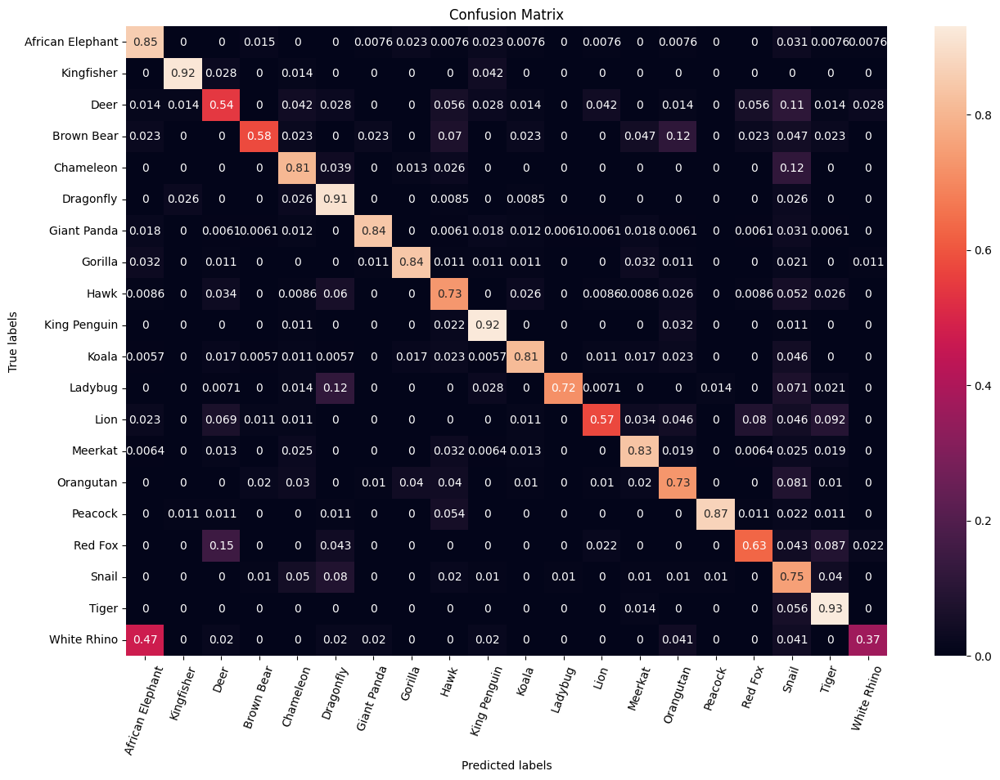

Predicted label ['Snail' 'Giant Panda' 'Snail' 'Meerkat']
True label ['Deer' 'White Rhino' 'Meerkat' 'Hawk']
Corresponding images are shown below


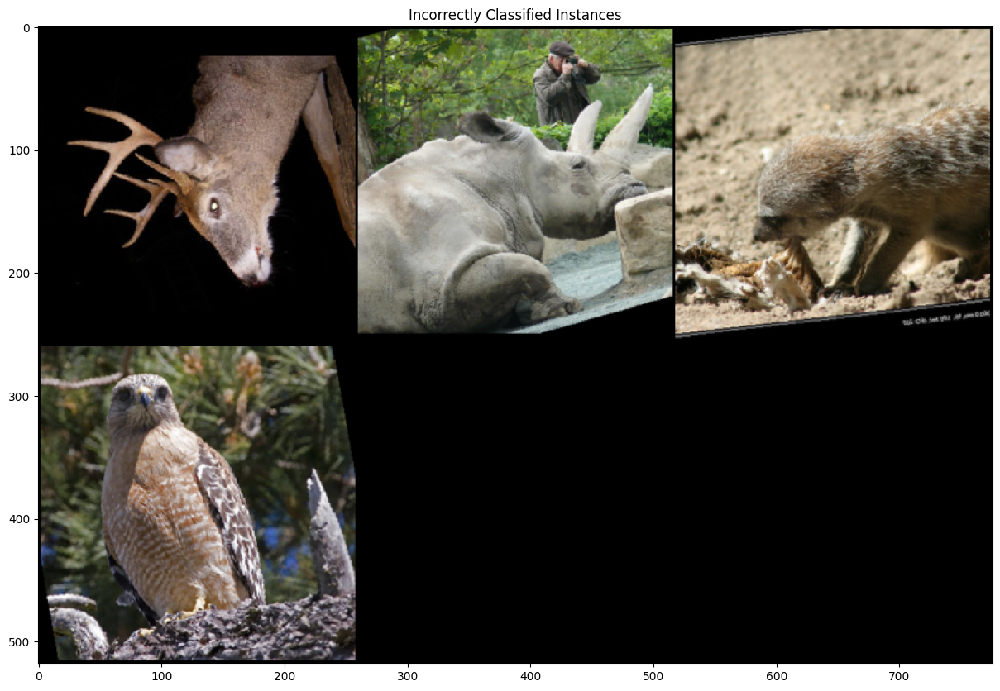

In [ ]:
# define and train the network
model = MyResNet()
optimizer = optim.Adamax(model.parameters(), lr=0.0005, weight_decay=1e-7)

params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))

model_test, train_loss, valid_loss, acc_record = train_part(model, optimizer, epochs = 10)


# report test set accuracy
check_accuracy(loader_val, model, analysis=True)


# save the model
torch.save(model.state_dict(), 'model.pt')

---

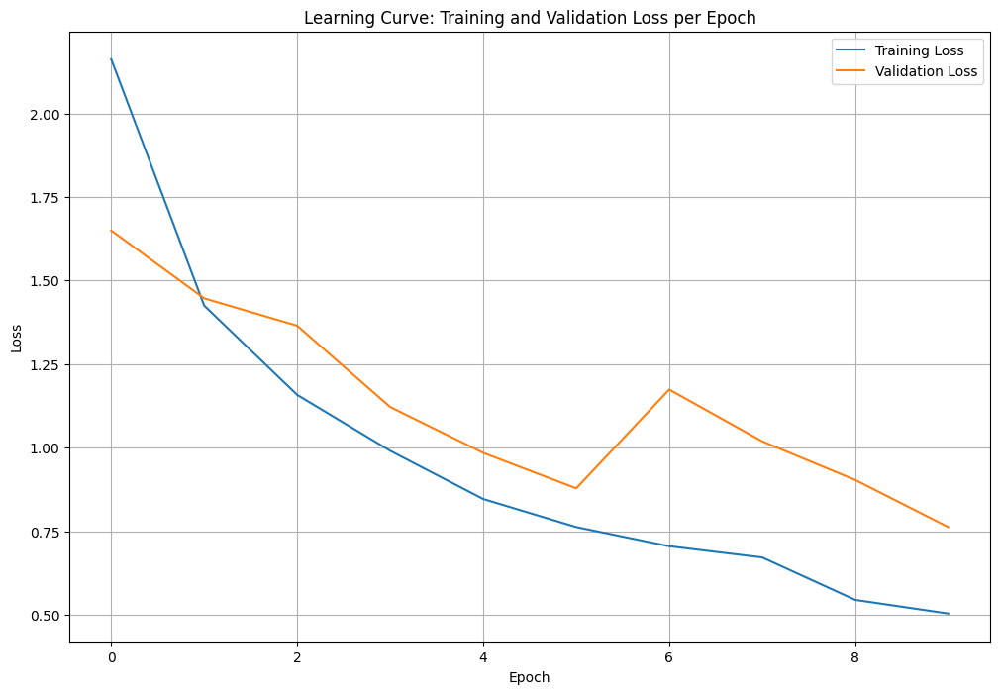

In [ ]:
#Learning curve
plt.figure(figsize=(12, 8))

plt.plot(train_loss, label='Training Loss')
plt.plot(valid_loss, label='Validation Loss')
plt.title('Learning Curve: Training and Validation Loss per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.grid(True)

plt.show()

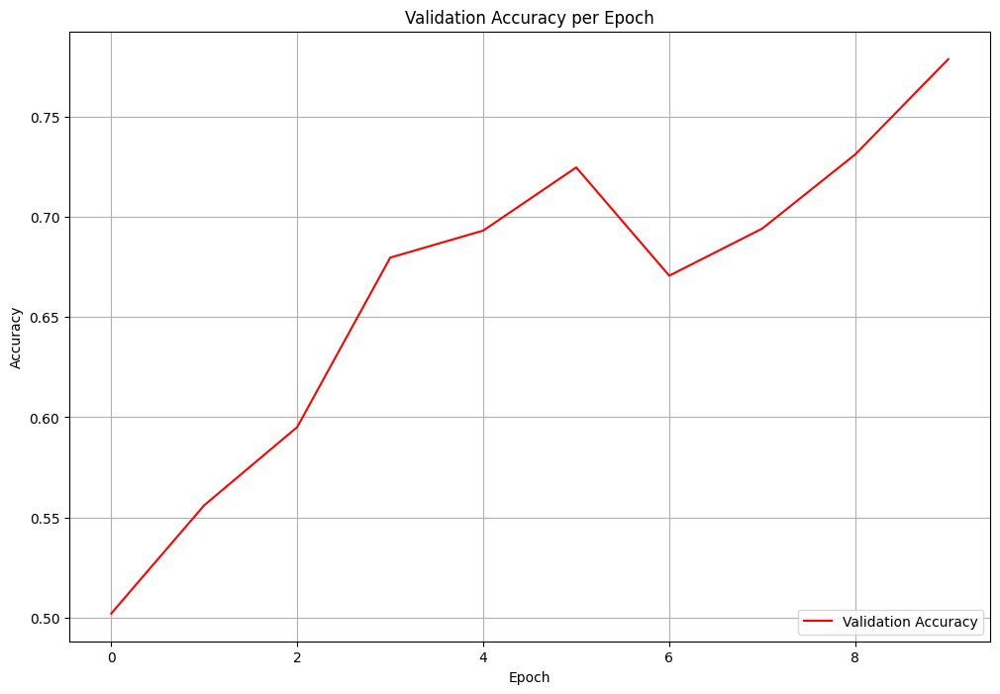

In [ ]:
#Accuracy curve
plt.figure(figsize=(12, 8))

plt.plot(acc_record, label='Validation Accuracy', color='red')
plt.title('Validation Accuracy per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.grid(True)

plt.show()

<!-- BEGIN QUESTION -->

### Network Performance

Run the code below when all engineering decisions have been made, do not overfit to the test set!

**Note that** this will appear in the output, and be checked by markers (so ensure it is present in the auto-export)

Got 1539 / 2000 correct of val set (76.95)
check acc <class 'torch.Tensor'> <class 'torch.Tensor'>


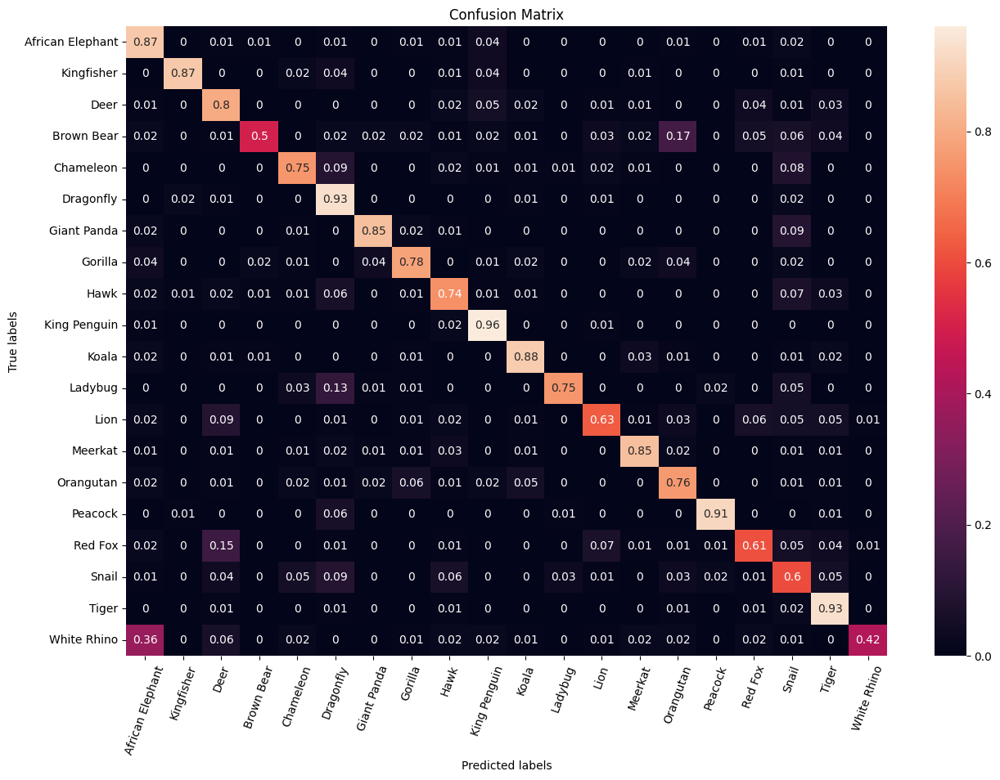

Predicted label ['Tiger' 'Snail' 'Chameleon' 'Snail' 'Dragonfly']
True label ['Snail' 'Red Fox' 'Ladybug' 'Meerkat' 'Ladybug']
Corresponding images are shown below


(0.7695, 0.7570030009374022)

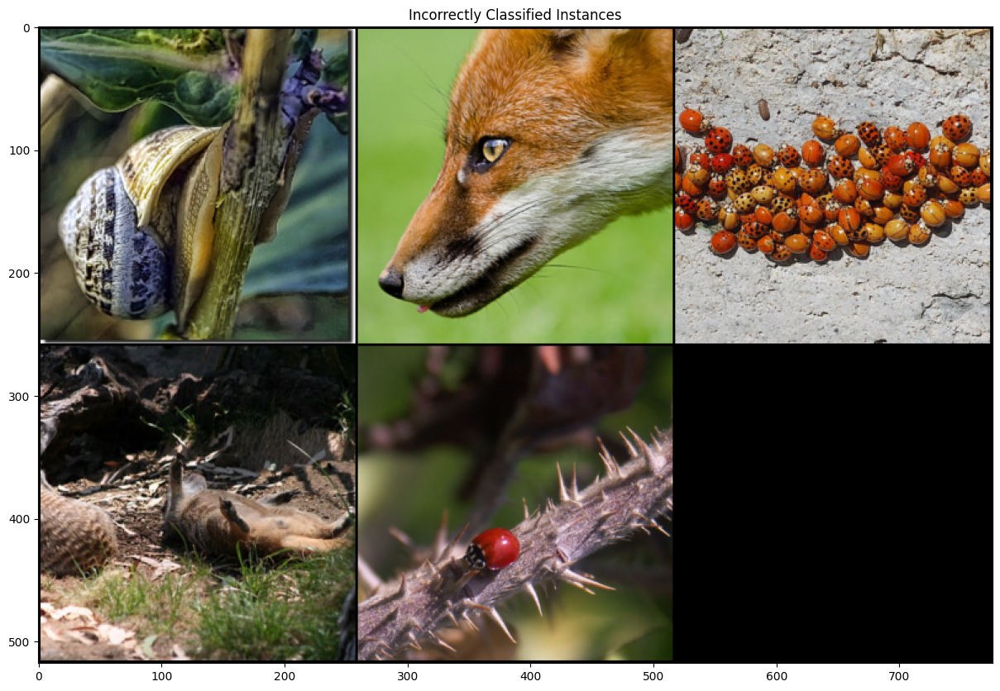

In [ ]:
# Run once your have trained your final model
check_accuracy(loader_test, model, analysis=True)

___

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Q2.1: Hyperparameter Search:
Given such a network with a large number of trainable parameters, and a training set of a large number of data, what do you think is the best strategy for hyperparameter searching? (3 points)

**Answer:**

In the context of networks handling image-related tasks, we emphasize the importance of four hyperparameter search methodologies that can be efficient solutions.  

- **Random Hyperparameter Search**: This approach entails testing diverse combinations of hyperparameters chosen randomly. These combinations are derived from sampling within specified distributions of potential parameters. Therefore, it allows to find interesting and high-performance solutions more rapidly compared to grid search. Moreover, it may yield unexpected solutions that are particularly well-suited for certain challenges. In a high dimensional problem, typical of image-related tasks, random hyperparameter search is an interesting approach. It's noteworthy to mention that we paralleled this method with our manual strategy in this coursework (see the conclusion for details). However, the 'random' nature of this method doesn't guarantee success. 

- **Bayesian Optimization**: Bayesian Optimization addresses hyperparameter search by employing a Bayesian statistical model. This technique is powerful because it leverages the outcomes of previous hyperparameter evaluations to determine the next set of hyperparameters to test. After exploring certain points, the algorithm improves its understanding of the objective function. This makes it particularly adept at efficiently navigating the hyperparameter space, avoiding unnecessary evaluations of poor-performing regions.
This is an interesting way of dealing with problems that have many hyperparameters choices (where grid and random searches may be excessively time-consuming.). It is particularly well-suited at tackling high-dimensional problems and scenarios where computational efforts are costly.

- **Evolutionary Algorithms**: Evolutionary Algorithms adeptly manage complex relationships between hyperparameters, especially when the search space is large. They can yield high-performing combination of parameter even for models that are not thoroughly understood. However, this method is computationally intensive (assess the fitness of each candidate). It is also sensitive to its own parameters (implying another set of choices). Although, Bayesian Optimization can yield great solutions, evolutionary algorithms (such as Quality-Diversity Optimization) are able to cover a large space of hyperparameter combinations. Therefore, if there is a special requirement of testing wide range of hyperparameters and yielding high performing solutions (e.g. healthcare application), EA-algorithms can be an interesting path.

- **AutoML Tools**: Tools such as Google's AutoML represent another interesting resource, particularly for well-established tasks (here image classification). These facilitate an automated process for hyperparameter tuning, potentially leading to great outcomes. However, this convenience comes at a cost and may limit the choice of “personalization”.  
<br>

**Conclusion**: Given these considerations, Bayesian Optimization emerges as the most fitting choice for networks characterized by many parameters and data points. In fact, it can produce high-performance solutions within a reasonable timeframe, especially when compared to grid and random search, for large-scale problems (high number of trainable parameters and large data set).

In our study, we employed a strategy akin to “knowledge-oriented random search”. Specifically, we conducted several empirical tests (the 'random' aspect) and drew comparisons based on initial hyperparameters informed by insights from our Deep Learning course, intuition, and literature. This approach proved quite effective for tasks that are well-understood and extensively documented in literature. Nevertheless, for problems encompassing more complex tasks and an extensive range of hyperparameters, adopting a method like Bayesian Optimization would likely yield more performing results.

---

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Q2.2: Engineering Decisions

Detail which engineering decisions you made to boost the performance of the baseline results. Why do you think that they helped? (7 points)

**Answer:**

The baseline model yielded the following results: accuracy of 704/2000 (35.20%) on the validation set, with confusion matrix values ranging from 0.03 (for Red Fox) to 0.71 (for Giant Panda).  

Through a review of literature, our Deep Learning course, and other web resources, we investigated several hyperparameters and conducted empirical tests on the training and validation sets to identify an efficient combination of hyperparameters.  

**Network Structure**:  

1. *Global Architecture*: The original network structure was inadequate in depth and width to effectively capture features and relationships, resulting in unsatisfactory performance, with certain classes almost not recognized at all. <br> 
To address this, we retained the concept of a residual network structure but transitioned to a network with more channels and hidden layers. This modification aimed to increase the model's capability, but we remain careful about the risk of overfitting, divergence and training time.
Initially, we leveraged the residual network's properties to develop a deeper network. In fact, the skip connections in Residual Networks facilitate the construction of deeper models without deviating from the true solution. With the original model lacking capacity for feature extraction, we designed an architecture enriched with additional hidden layers. <br>
Specifically, we configured 3 blocks at 64 channels, 4 blocks at 128 channels, 6 blocks at 256 channels, and 3 blocks at 512 channels. <br>
We can observe a gradual increasing in channel count, reflecting our strategy to extract more complex and abstract patterns as the network deepens. Conversely, the initial layers of the network remain relatively simple, focusing on the extraction of evident and basic patterns (e.g., edges, colors). 
At the same time, there is also an increasing number of blocks (from 3 to 6) as we progress through the network. This allows to have more capacity when it comes to detect complex patterns. However, the final block series of 512 channels deviates from this increasing rule due to computational constraints.
Taking advantage of the network's residual structure, we built a deeper network capable of extracting more abstract features and more complex relationships. However, as the model is more complex (width and depth), we tried to ensure that it has sufficient generalization capability and avoid overfitting (see the following engineering decisions). <br>
We tried several combinations of residual blocks, leading to a more or less deep architecture. The final architecture was chosen as an interesting compromise between performance, computation time and model complexity.


2. *Regularization (Dropout and Batch Normalization)*: Within the residual block structure, we opted for Batch Normalization over Dropout, as it empirically yields superior results and accelerates convergence. Additionally, our chosen batch size (64) facilitated the introduction of noise, thereby incorporating regularization into the model. Testing the simultaneous use of Batch Normalization and Dropout resulted in slower convergence without performance enhancement, validating our decision to rely solely on Batch Normalization. This choice was supported by the inherent regularization provided by Batch Normalization and the fact that ResNet architectures are less prone to overfitting. 

3. *Maxpooling Layer Hidden*: To manage the increased complexity of the model while limiting memory requirement and accelerating training, we introduced two maxpooling layers with a stride of 2. The maxpooling layer in the middle of the network aid the model in focusing on essential abstract features, thereby enhancing generalization capabilities and robustness against spatial variations. Empirically, we observe a speed up in training and significant positive impact on the performance on the validation dataset (validation accuracy went from 65.3% to 75.1%).

4. *Maxpooling Layer Output*: Literature suggests that average pooling can enhance model robustness and avoid using a final fully connected layer entirely. In our empirical testing, a maxpooling layer (adaptive) yielded better results, contributing to hierarchical feature processing and ensuring focusing on important information (validation accuracy ranges went from approximately [72% - 74%] to [75% - 78%]). 


**Optimizer**: We preferred to use Adam's algorithm for the optimizer in order to have an adaptive handling of the learning rate. Therefore we did not add on top of that, a learning rate scheduler, because this optimizer already efficiently ensured convergence within a reasonable timeframe. To slightly speed up the process at the beginning, we increase the learning rate to 0.0005.

**Batch Size**: Given the elevated computational demands of our network structure, we set the batch size at 64 to balance RAM requirements and maintain a feasible training process. Smaller batch sizes were tested but yielded inferior results.  

**Data Augmentation**: We implemented a data augmentation strategy on the training dataset utilizing PyTorch's transform functions. It should be noted that our approach did not increase the dataset size but rather focused on augmenting diversity. This strategy effectively improved performance by approximately 4% (validation accuracy went from 74% to 78%), prompting us to prioritize diversity over mere quantity in our data augmentation efforts. 
We selected 3 transformations:
-rotation: because within a class of image we can observe some rotation between examples.
-affine: to make the model more robust with perspective issue.
-flip: based on the dataset, it appears straightforward that horizontal flip is useful.

**Number of Epochs and Early Stopping**: While a more extended training period with early stopping could potentially yield improvements, we found that 10 epochs struck an optimal balance between performance and computational time.  
<br>

**Conclusion**: In conclusion, our model adjustments, including a more complex structure and thoughtful regularization (via BatchNorm and maxpooling layers), resulted in a promising model capable of capturing patterns. This model is also a great foundation for potential enhancements and optimizations (see Q2.3 and Q3.2).

<br>

In the tab below, we display some of the key comparisons among many trials. It should be noted that, we did not based our hyperparameter choices only on the validation accuracy but also on the confusion matrix (of the validation set), the learning curve, training time... The tab provides a brief high level overview.

| Architecture type | Maxpool layer hidden | learning rate | Data augmentation | Dropout | Batch size | Validation result |
|----------|----------|----------|----------|----------|----------|----------|
| Original (provided as base) | 1 layer | 0.0001 | No | No | 128 | 35.20% |
| 25 convolutions | 1 layer | 0.0001 | No | No | 128 | 69.83% |
| 33 convolutions | 2 layer | 0.0001 | No | No | 32 | 72.15% |
| 33 convolutions | 1 layer | 0.0005 | No | No | 64 | 65.35% |
| 33 convolutions | 2 layer | 0.0005 | Yes | Yes | 64 | 74.82% |
| 33 convolutions | 2 layer | 0.0005 | Yes | No | 64 | 78.28% |


---

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->



### Q2.3: Out of distribution evaluation

Lets see how your trained model performs when evaluated on cartoons of the 20 animal classes. Do not try and modify your model to perform well on this task, this is just a reflective exercise. How did your model perform at the task? Why do you think this was the case? Detail one method which you expect would improve model performance. (2 points)

In [ ]:
ON_COLAB = True

!wget https://zenodo.org/records/10424022/files/cartoons.zip?download=1

if ON_COLAB:
    !unzip /content/cartoons.zip?download=1 > /dev/null

else:
    !unzip cartoons.zip?download=1 > /dev/null

--2024-02-01 14:58:47--  https://zenodo.org/records/10424022/files/cartoons.zip?download=1
Resolving zenodo.org (zenodo.org)... 188.184.103.159, 188.185.79.172, 188.184.98.238, ...
Connecting to zenodo.org (zenodo.org)|188.184.103.159|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1737267 (1.7M) [application/octet-stream]
Saving to: ‘cartoons.zip?download=1’

cartoons.zip?downlo 100%[===================>]   1.66M  1.51MB/s    in 1.1s    

2024-02-01 14:58:50 (1.51 MB/s) - ‘cartoons.zip?download=1’ saved [1737267/1737267]



In [ ]:
mean = torch.Tensor([0.485, 0.456, 0.406]) # assuming same dist as imagenet
std = torch.Tensor([0.229, 0.224, 0.225])
transform = transforms.Compose(
        [
            transforms.Resize(256),
            transforms.CenterCrop(256),
            transforms.ToTensor(),
            transforms.Normalize(mean.tolist(), std.tolist()),
        ]

    )
cartoon_path = ('/content/' if ON_COLAB else '') + 'cartoons'


cartoon_dataset = datasets.ImageFolder(cartoon_path, transform=transform)

print(len(cartoon_dataset))

batch_size = 64

cartoon_loader = DataLoader(cartoon_dataset, batch_size=batch_size, shuffle=True, num_workers=2)

400


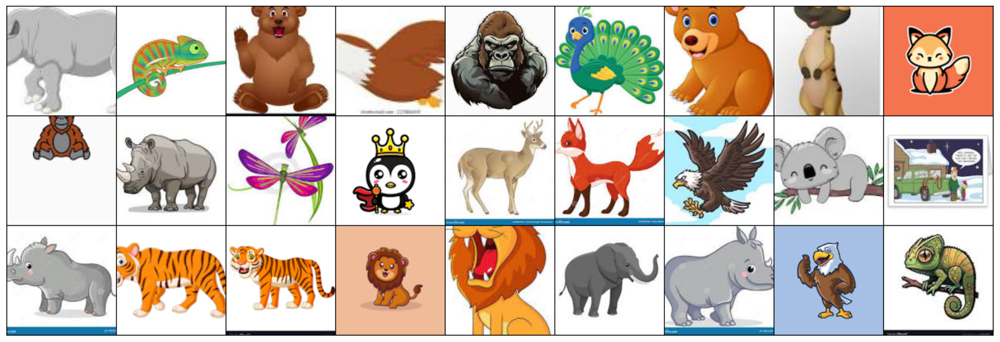

In [ ]:
sample_inputs, _ = next(iter(cartoon_loader))
fixed_input = sample_inputs[:27, :, :, :]

img = make_grid(denorm(fixed_input), nrow=9, padding=2, normalize=False,
                value_range=None, scale_each=False, pad_value=0)

plt.figure(figsize=(20,10))
plt.axis('off')
show(img)

Got 110 / 400 correct of val set (27.50)
check acc <class 'torch.Tensor'> <class 'torch.Tensor'>


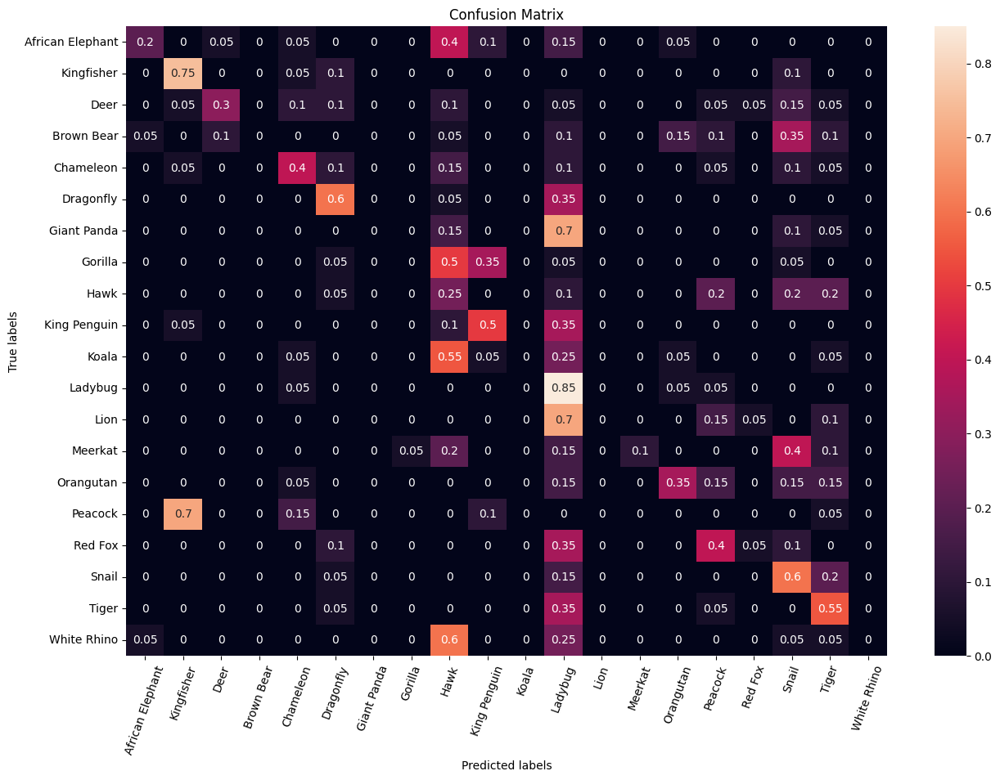

Predicted label ['Hawk' 'Peacock' 'Ladybug' 'King Penguin' 'Ladybug' 'Ladybug' 'Peacock'
 'Hawk' 'Snail']
True label ['White Rhino' 'Red Fox' 'Giant Panda' 'Peacock' 'Red Fox' 'Dragonfly'
 'Red Fox' 'White Rhino' 'Brown Bear']
Corresponding images are shown below


(0.275, 4.347674199513027)

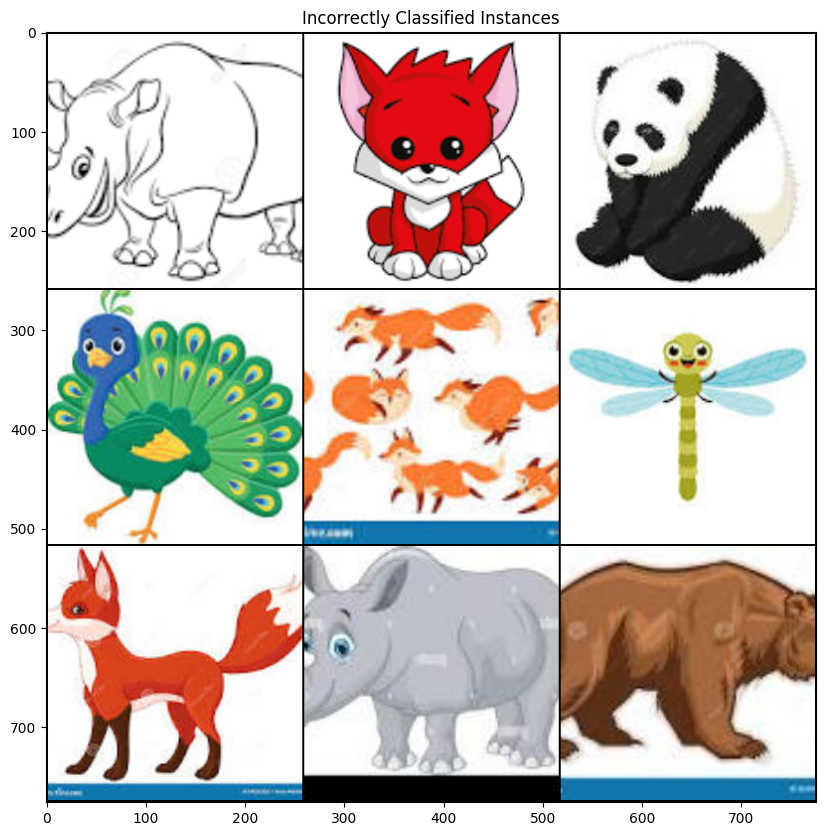

In [ ]:
check_accuracy(cartoon_loader, model, analysis=True)

**Answer:**


**Model Performance**: Model’s performance ranges from 76.95% of accuracy for Natural Image Net to 27.5% of accuracy for cartoon images.

**Potential Reasons for Performance Discrepancy**: 
The stark contrast in performance can be attributed to a considerable domain shift in the dataset, which impacts the results. The defining features of each class, particularly colours, shapes, and textures, manifest distinctly across datasets. Additionally, background elements carry information and play a role in the classification. In natural image sets, backgrounds often assist in refining class predictions. However, in cartoon datasets, backgrounds tend not to provide meaningful insights into animal classes (as it is often white background). 

A potential improvement involves tuning the model to focus more on animal characteristics and less on background elements. <br>
Despite both datasets depicting the same animal classes, the divergence in accuracy highlights a limitation of the chosen deep neural architecture. While adept at identifying textures and fine details in natural images, the model struggles to generalize these features to cartoon representations.  
<br>

**Strategies to Improve**:
- Model Performance: Given the model's proficiency with the Natural Image Net dataset, it serves as a promising foundation for training on the cartoon dataset, considering their shared structure (i.e., identical labels). 

- Dataset Modification: A preliminary step involves implementing aggressive data augmentation on the Natural Image dataset. This process might include altering color distributions, introducing blurring to de-emphasize texture reliance, and minimizing (or even removing) background influence to direct the model's focus towards animal features. The objective is to create a dataset wherein the model can recognize patterns applicable to both natural and cartoon images. 

- Neural Network improvement: It is also crucial to address the model's susceptibility to overfitting, particularly with the natural image set, and ensure its adaptability to the cartoon dataset. Introducing regularization techniques, such as dropout layers, could be beneficial. Although dropout was initially excluded for the natural image dataset, its inclusion might be an improvement in the aim of generalizing to other datasets, like cartoons. If the regularization does not bring enough improvement, a simpler architecture could be used, with a lower number of hidden layers. <br>
Finally, a combination of targeted data augmentation and reinforced regularization could lead to an interesting pre-trained model.  

- Fine-tuning for Cartoon Dataset: Subsequently, we could fine-tune the pre-trained model using a composite dataset of natural and cartoon images. This process should be approached with a small learning rate to prevent abrupt changes in the model. 

<br>

The final step involves evaluating the fine-tuned model on a validation dataset. This assessment will determine the effectiveness of the implemented data augmentation, regularization, and fine-tuning strategies. Depending on the outcomes, the next course of action might involve either a shift to a different neural architecture or further refinement of the current methodologies (additional data augmentation, fine-tuning adjustments, etc.).

<!-- END QUESTION -->

## Part 3 (10 points)

The code provided below will allow you to visualise the feature maps computed by different layers of your network. Run the code (install matplotlib if necessary) and **answer the following questions*(:

<!-- BEGIN QUESTION -->

### Q3.1 : Learned Features

Compare the feature maps from low-level layers to high-level layers, what do you observe? (4 points)

**Answer:**

<br>
We initiated our model with an entry channel number set at 64. For practicality, we limited our visualization to 24 feature maps for each layer of interest. Our analysis encompasses the first convolution layer ('conv1') and four subsequent layers ('layer1', 'layer2', 'layer3', 'layer4') that correspond to groups of blocks in our ResNet architecture (refer to Q2.2 for details).  
<br>

**Conv 1**: In the feature maps corresponding to 'conv1', the results allow for visual interpretation, revealing both the animal and aspects of its background. This layer is instrumental in extracting fundamental features like edges, corners, textures, and colours. Initially, the image resolution within the network is relatively high. The features extracted at this stage are generic, with certain features accentuated in distinct ways by different kernels.

**Layer 1**: Moving to 'layer1', the animal remains visually discernible in the feature maps, with a decent resolution. This layer refines feature extraction, subtly accentuating elementary features such as colours and contours. A noticeable shift in granularity between the animal and its background is evident, effectively distinguishing the animal from its surroundings in most feature maps.  

**Layer 2**: At 'layer2', the feature maps evolve into more abstract representations. These maps begin to denote specific patterns associated with small animal parts or background elements. For example, certain maps may highlight parts of the head, eyes, or wings. The interpretability of some feature maps becomes challenging at this stage, as this layer combines basic features from preceding layers into more complex and specific structures.

**Layer 3**: Post 'layer3', there's a notable decrease in image resolution, aligning with the integration of a maxpooling layer preceding 'layer3'. Distinct identification of the animal and background elements becomes unfeasible, signalling a shift in the model's focus towards more specific features. These complex patterns play an important role in differentiating between classes, particularly when dealing with similarly categorized examples.  

**Layer 4**: At 'layer4', we encounter the highest level of feature representation. Here, the image resolution is significantly diminished, and we cannot identify visually the actual feature extractions. The feature maps at this stage encode complex and abstract information, predominantly concerning the semantic content and patterns, characteristic of a particular class.  

<br>
Therefore, each layer embodies a stage of feature extraction, ranging from simple attributes like edges, colours, and shapes to complex and abstract features, that are challenging to interpret visually. As we progress through the network, the feature maps become less visually interpretable, increasingly concentrating on abstract, class-specific features.

---

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Q3.2: Performance Analysis

Use the training log, reported test set accuracy and the feature maps, analyse the performance of your network. If you think the performance is sufficiently good, explain why; if not, what might be the problem and how can you improve the performance? (4 points)

**Answer:**

<br>
It should be noted that each training run of the model may yield slightly different results, with accuracy fluctuating by approximately ±3%. However, our analysis remains relevant across different runs, as we obtain similar results (accuracy and loss on the validation dataset, learning curve…).
<br>


**Training Log / Validation Accuracy**: <br>
The model achieved an average accuracy of 76.95% during training, correctly classifying 1539 out of 1998 instances in the validation set. The validation accuracy curve demonstrates overall progression. Given our “constraint” of 10 epochs (for time purpose), some abrupt changes are noticeable, indicating epochs where the model struggled to learn. Despite some fluctuations for one epoch (epoch 6), the curve suggests a general progression of the training process. 

<br>

**Learning Curve**: <br>
The learning curve illustrates the behaviour of the training and validation losses. Both curves trend downward, with the validation loss slightly exceeding the training loss. This pattern indicates a correct training process, with the model improving. The decreasing training loss suggests the model is not underfitting, while the parallel decline in validation loss implies the model is likely not subject to overfitting. <br> 
However, we can observe occasional spikes in validation loss, indicating that the model struggle to learn for one or two epochs before getting back on progression. This is potentially the sign of overfitting issue, but within 10 epochs, the learning curve does not give clear sign. An extended training period might allow us to observe the model's behaviour over a longer training period and implement an early stopping. <br> 
These fluctuations could also be attributed to the variability introduced by the data augmentation processes (e.g., flips, rotations, and affine transformations) applied also to the validation dataset. Additionally, the learning rate might be contributing to the observed peaks in the learning curve. At epoch 6, the model appears to overshoot the optimal solution. <br> 
It should be noted that the learning curve was genereated from a single run. The occasional spikes noted weren't consistently observed across multiple runs. Averaging the results over multiple training runs could yield a smoother curve. However, directly addressing this issue can be beneficial, especially since these spikes tend to occur often around epoch 6 (see below).

<br>

**Confusion Matrix**: <br>
The diagonal entries of the confusion matrix indicate correct classifications (true positives), with most values close to 1. For instance, 'King Penguin' and 'Kingfisher' are predicted with high probabilities of 0.96 and 0.87, respectively. However, some classes like 'Brown Bear' show lower true positive rates (0.5), suggesting difficulty in those classifications. Off-diagonal elements reveal misclassifications (false positives and negatives), like 'Red Fox' being confused with 'Deer' (probability of 0.15). A similar observation is available with the ‘White Rhino’ that has a probability of 0.36 of being predicted as ‘African Elephant’. This confusion might result from visual similarities between classes (which makes sense with ‘White Rhino’ and ‘African Elephant’). <br> 
Overall, 18 classes show a probability of correct classification over 60%. The final test set accuracy stands at 76.95%, indicating a competent model with room for improvement. 

<br>

**Feature Maps**: <br>
As detailed in Q3.1, the feature maps demonstrate appropriate progression through the network. Early layers ('conv1', 'layer1') offer visually interpretable feature maps, mostly representing basic features on high resolution image. Mid-network layers ('layer2', 'layer3') shift focus to more specific and complex features, with decreasing resolution. The final layer ('layer5') encapsulates complex and abstract features with a focus on semantic content. This progression aligns well with our architectural design. 
In addition, we can see on several feature maps, especially in 'layer1' and 'layer2', that some background elements are highlighted. To confirm these observations we could use complementary methods (see 3.3). This suggests that the model is potentially using background elements to classify animals, which is not very efficient (e.g. applied on a different animal dataset).

<br>

**Conclusion**: <br>
Overall, the model delivers stable and satisfactory results (with a reasonable number of parameters). However, the learning curve indicates that we can still enhance the learning process (potential overfitting issue) and investigate a longer training (higher number of epochs). The confusion matrix helps identify misclassification trends, providing insights for targeted improvements, such as additional training data, feature engineering, or model adjustments for classes like 'Brown Bear', 'Red Fox', and 'White Rhino'.  
<br>

To enhance the model, we should aim to balance performance across all 20 classes, potentially at the cost of slight reductions in performance for certain classes to improve overall consistency and reduce significant misclassifications.
  
- *Data Augmentation Improvement*: Given the model's tendency to focus on backgrounds in the Natural Image set, removing or softening the background could make the model more class-specific. Manual analysis of misclassified class pairs could inform tailored data augmentation. Based on that, we could adapt our data augmentation process to increase the number of examples of these problematic classes and improve the diversity thanks to a set of transformation. However this process should be executed carefully, as we do not want that our model focuses only certain class. 
Treating data augmentation as a hyperparameter to study its impact through multiple simulations might also be beneficial. 

- *Learning Rate Scheduler*: As we often observed occasional spike around epoch 6, we could set up a learning rate scheduler on top of the adaptative handling of Adam. Specifically, introducing a decreasing learning rate (potentially on an exponential scale) around epoch 6 might help prevent the model from overshooting the optimal solution.

- *Hyperparameter Search*: The learning curve's volatility, particularly in validation loss, suggests room for optimizing parameters like the optimizer, learning rate, and batch size. While increasing batch size demands more RAM, it could stabilize the training process. Bayesian Optimization, despite being time-consuming, would be an effective approach for hyperparameter tuning. 

- *Dataset Investigation*: A detailed analysis of the dataset to understand class distribution and image characteristics could inform more meaningful data augmentation strategies and ensure balanced data distribution across training, validation, and testing sets. Here the goal could be to identify potential source of instability affecting model's generalization capability. 

- *Pre-trained Models*: Leveraging powerful pre-trained models as a starting point and fine-tuning them on our dataset could refine the model's weights and enhance its performance for our specific application. Especially for such well-known task (image classification), this could be an efficient approach.

- *Neural Network revision*: Based on a “ablation study” result (see Q3.3), we could also investigate shallower architecture. This should improve generalization capacity and smooth the learning curve. However, this may not be the type of modification that will help to improve the distinction between similar classes, for example between ‘White Rhino’ and ‘African Elephant’.

---

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Q3.3: Alternative Evaluations

What are the other possible ways to analyse the performance of your network? (2 points)

**Answer:**

<br>
In this coursework, we monitored our network's performance using a variety of metrics, including the confusion matrix, accuracy curve, learning curve, and feature maps from different layers.  

- To enrich our evaluation, we could consider incorporating additional performance metrics like Precision (reflecting the accuracy of predictions), Recall (indicating the model's capability to correctly identify each class), and the F1-score (providing a balance between Precision and Recall), multi-label classification context.

- Employing a macro-average approach to these metrics could prove beneficial, as it treats all classes equally. This approach is especially pertinent for metrics like macro-average Recall, which can highlight if a specific class is consistently misclassified, a critical insight for datasets with imbalanced class distributions. Also, as we had problematic classes, it could be beneficial to set up this metric, to see potential improvement.

- Given our choice to employ a deeper architecture than the original model, it would be beneficial to evaluate this decision by understanding the contribution of each network component. An “ablation study”, where we systematically remove parts of the network (such as layers or residual blocks) and observe the impact on performance, could provide insights into the importance of each network component. Therefore, we can have a better understanding of the role of each part and perhaps opt for a shallower network.

- Additionally, implementing a Receiver Operating Characteristic (ROC, from scikit-learn website) curve, could further elucidate our model's performance. This analysis examines the trade-off between the true positive rate and the false positive rate. It can be conducted through either a "one-vs-rest" approach (comparing each class against all others) or a "one-vs-one" approach (comparing each class directly to each other). Such an analysis is particularly useful when dealing with class discrepancies, offering another viewpoint of the model's ability to distinguish between classes.

- Opting for a deeper neural architecture necessitates a focus on interpretability, as the complexity of such networks often obscures the decision-making process and questions the legitimacy behind results. We could analyse the weight distribution and use SHAP (SHapley Additive exPlanations) to examine feature importance. Additionnaly, Saliency maps, derived from gradient-based methods (like vanilla gradient or Grad-CAM), highlight the "importance" of each pixel in contributing to the model's predictions. By mapping these gradients back to the input space, saliency maps visually depict how changes in each pixel affect the model's decision, and indicate which parts of the image the model is focusing on. For instance, we could see if the model is fixating on relevant regions (the animal) or being misled by less pertinent areas (the background). <br> 
The analysis of interpretability can be coupled with "ablation study", as we want to examine role and importance of each module in our network. 

---

<!-- END QUESTION -->

**Feature Visualization**

The code below will visualize the features of your network layers (you may need to modify the layer names if you made changes to your architecture).

If you change the plotting code, please ensure it still exports correctly when running the submission cell.

In [ ]:
import matplotlib.pyplot as plt

def plot_model_features():
    fig = plt.tight_layout()
    activation = {}
    def get_activation(name):
        def hook(model, input, output):
            activation[name] = output.detach()
        return hook
    vis_labels = ['conv1', 'layer1', 'layer2', 'layer3', 'layer4']

    for l in vis_labels:
        getattr(model, l).register_forward_hook(get_activation(l))


    data, _ = test_dataset[999]
    data = data.unsqueeze_(0).to(device = device, dtype = dtype)
    output = model(data)

    for idx, l in enumerate(vis_labels):
        act = activation[l].squeeze()

        # only showing the first 16 channels
        ncols, nrows = 8, 3

        fig, axarr = plt.subplots(nrows, ncols, figsize=(15,5))
        fig.suptitle(l)

        count = 0
        for i in range(nrows):
            for j in range(ncols):
                axarr[i, j].imshow(act[count].cpu())
                axarr[i, j].axis('off')
                count += 1

<!-- BEGIN QUESTION -->



<Figure size 640x480 with 0 Axes>

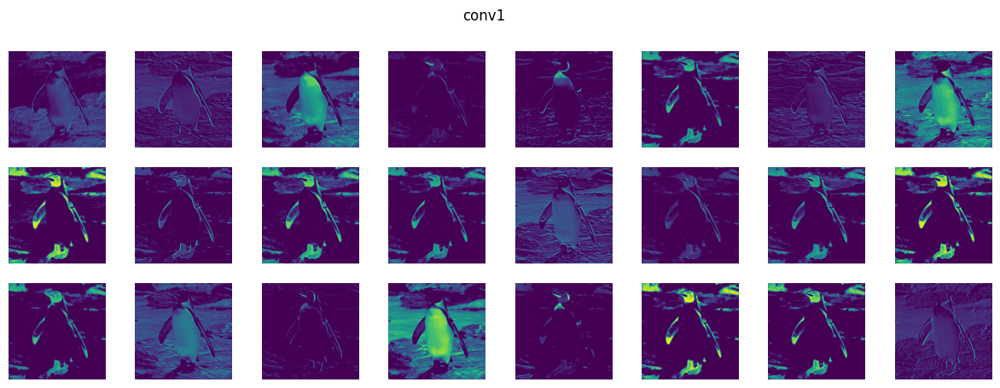

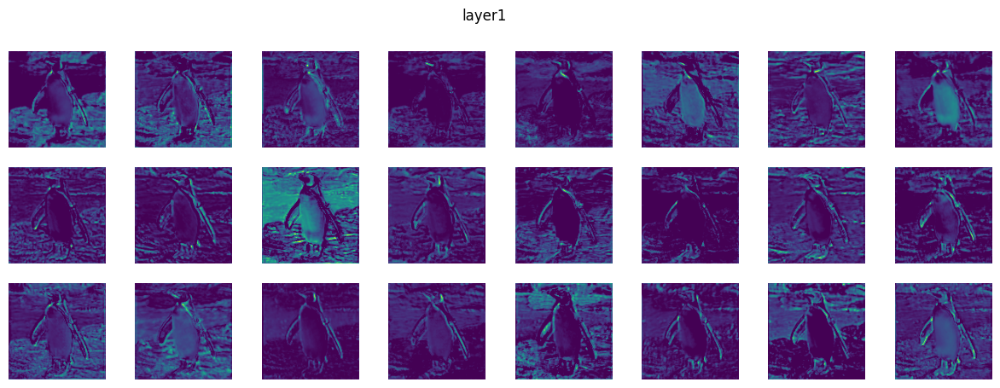

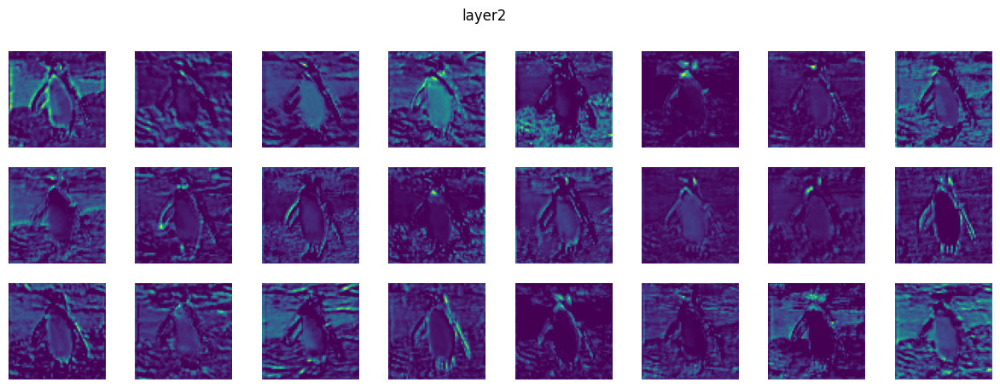

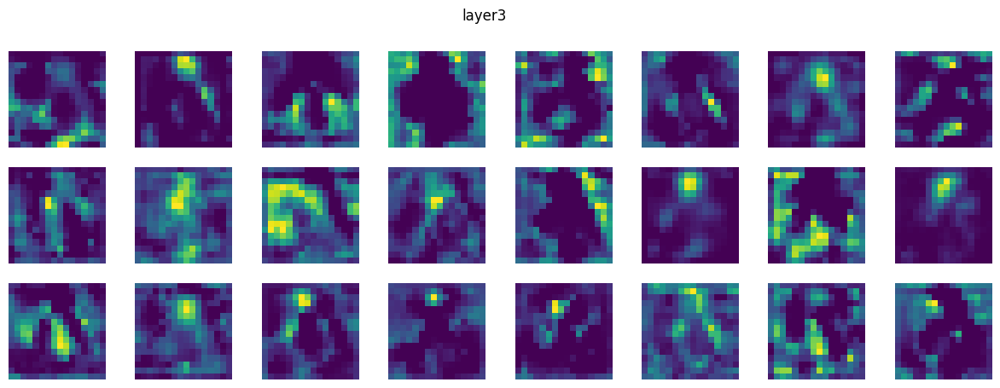

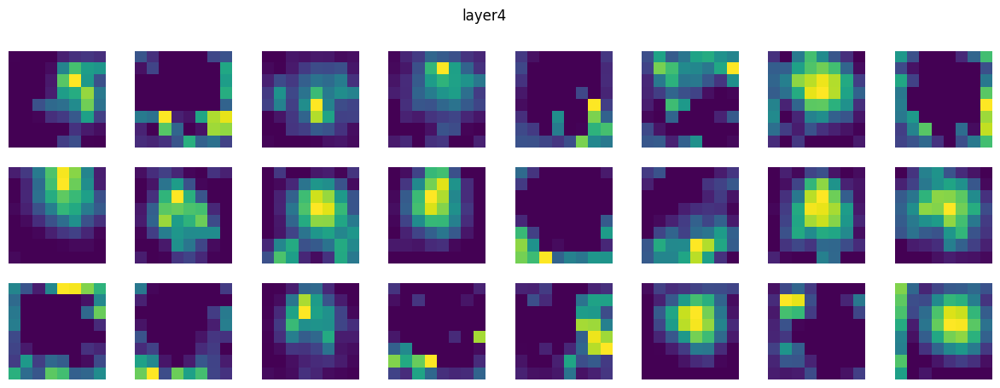

In [ ]:
# Visualize the figure here, so it is exported nicely
plot_model_features()

**Train, Validation Loss Visualization**


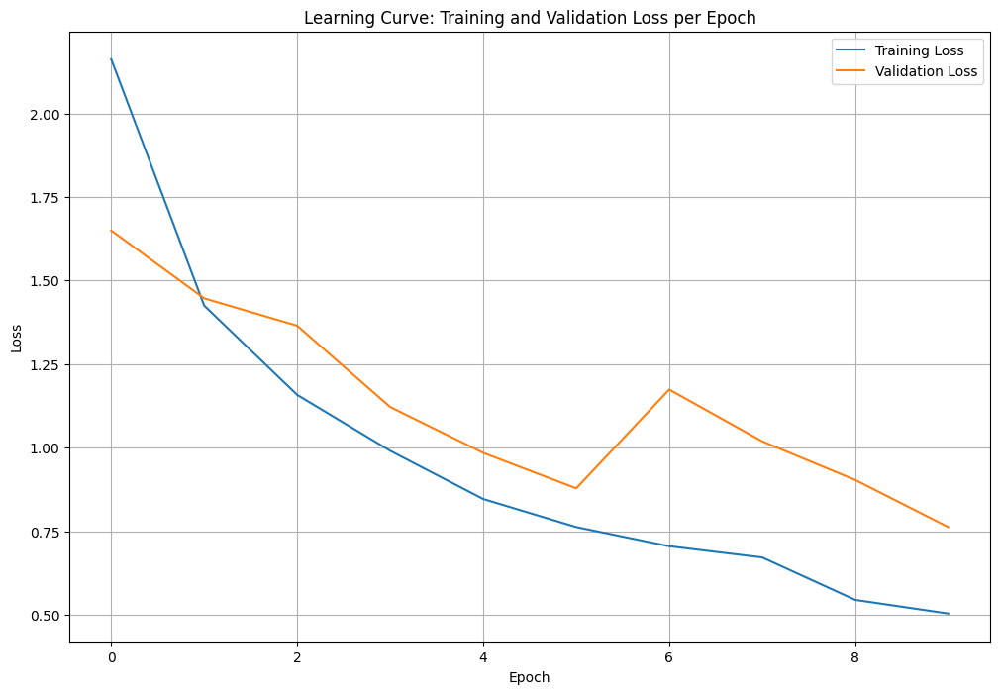

In [ ]:
#Learning curve
plt.figure(figsize=(12, 8))

plt.plot(train_loss, label='Training Loss')
plt.plot(valid_loss, label='Validation Loss')
plt.title('Learning Curve: Training and Validation Loss per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.grid(True)

plt.show()

**Accuracy Visualization**


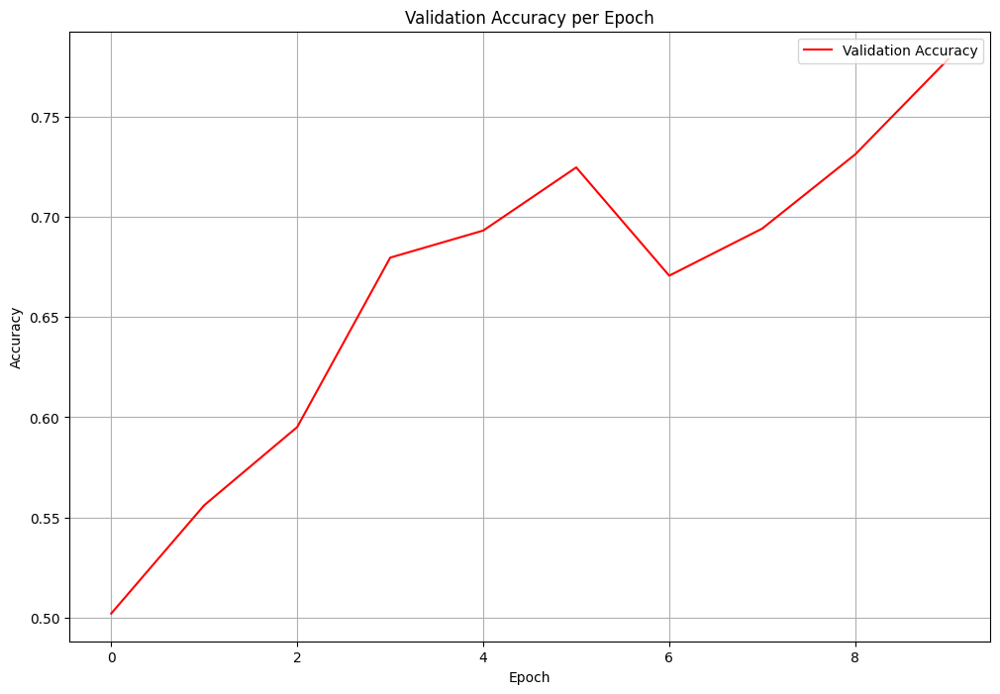

In [ ]:
#Accuracy curve
plt.figure(figsize=(12, 8))

plt.plot(acc_record, label='Validation Accuracy', color='red')
plt.title('Validation Accuracy per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='upper right')
plt.grid(True)

plt.show()

**Confusion matrix Visualization**


Got 1539 / 2000 correct of val set (76.95)
check acc <class 'torch.Tensor'> <class 'torch.Tensor'>


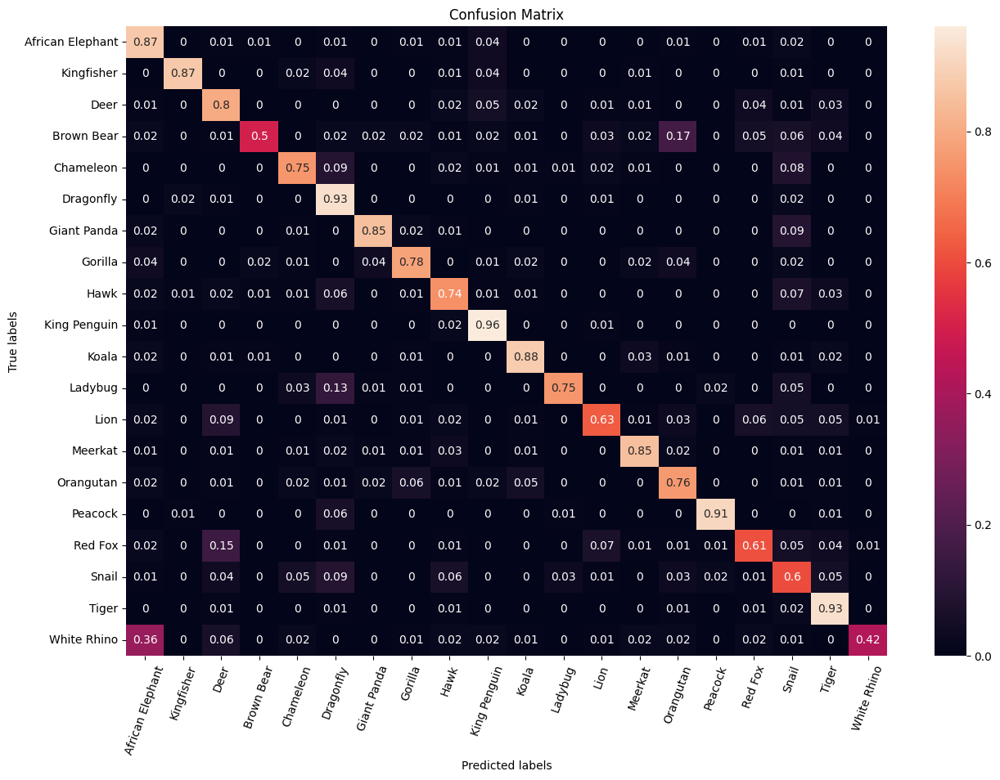

Predicted label ['Red Fox' 'African Elephant' 'African Elephant' 'Tiger' 'Koala'
 'Chameleon']
True label ['Deer' 'Orangutan' 'Gorilla' 'Hawk' 'Brown Bear' 'Snail']
Corresponding images are shown below


(0.7695, 0.7543208515271544)

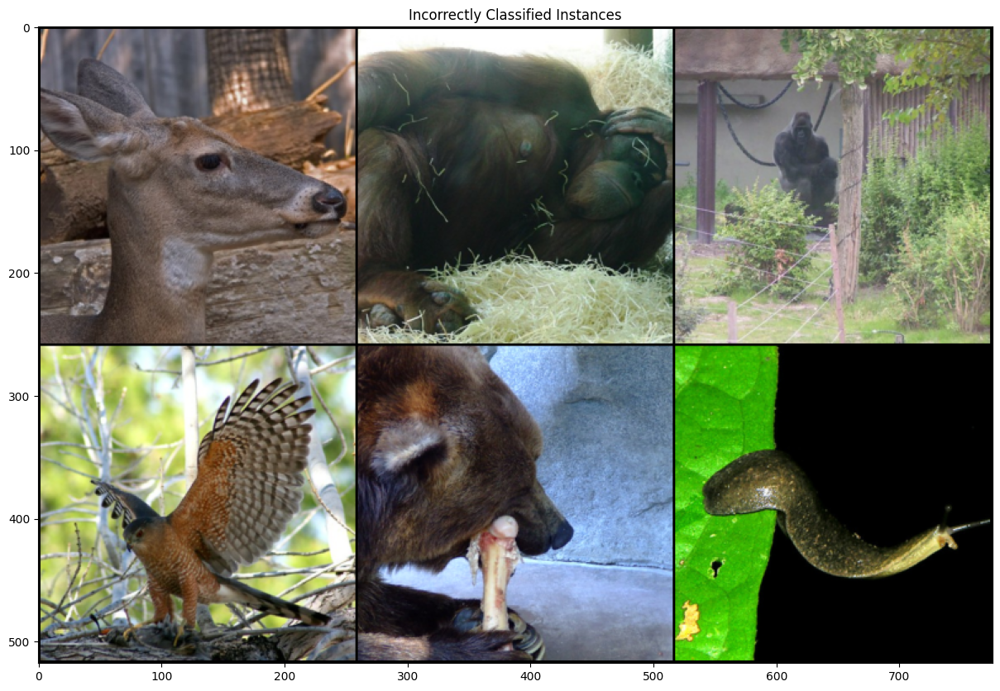

In [ ]:
check_accuracy(loader_test, model, analysis=True)

<!-- END QUESTION -->

## Submission
Git push your finalized version of this notebook (with saved outputs) to the gitlab repo which you were assigned. You should request our tests once and check that the ```preview.pdf```:
* Passes all public tests (these are the same ones provided / embedded in the notebook itself)
* Contains your qualitative answers
* Contains your figures (confusion matrix and network features)

---

To double-check your work, the cell below will rerun all of the autograder tests.

In [41]:
grader.check_all()

BatchNorm Layer results: All test cases passed!
BatchNorm Layer - 1 message: Shape Test Passed
BatchNorm Layer - 2 message: Type Test Passed
BatchNorm Layer - 3 message: Param Name Test Passed
BatchNorm Layer - 4 message: Param Shape Test Passed

Convolution Layer results: All test cases passed!
Convolution Layer - 1 message: Shape Test Passed
Convolution Layer - 2 message: Type Test Passed
Convolution Layer - 3 message: Param Name Test Passed
Convolution Layer - 4 message: Param Shape Test Passed

Linear Layer results: All test cases passed!
Linear Layer - 1 message: Shape Test Passed
Linear Layer - 2 message: Type Test Passed
Linear Layer - 3 message: Param Name Test Passed
Linear Layer - 4 message: Param Shape Test Passed

MaxPool Layer results: All test cases passed!
MaxPool Layer - 1 message: Shape Test Passed
MaxPool Layer - 2 message: Type Test Passed